# COGS 118B Final Project

#### Authors
* Evan Eguchi
* Elliot Lee
* Finn St John
* Shantelle Serafin
* Michael Lee
* Shushruth Kallutla

### Background and Overview
For our final project for this class, we decided to analyze audio files. We are all very passionate about music, and for this reason, we knew we wanted to do some sort of analysis on music. After a long search on Kaggle, we stumbled upon the GTZAN Dataset, which is a dataset of 1000 thirty-second audio samples from different songs, along with their spectrograms. We decided to split into two teams: one to analyze the spectrogram data and one to analyze the audio files.

The dataset is divided into ten genre groups of 100 songs each. These genres include blues, classical, country, disco, hiphop, jazz, metal, pop, reggae, and rock. After some preliminary exploration of the data, we found that when decoded, the .wav files were each ~660,000-length integer time series arrays. Each of these values represented  1/22,050 of a second, or 45.35 𝜇s. The spectrogram images after processing had 73248 dimensions. Because of the high-dimensionality of this data, we thought PCA would be a great first algorithm to implement for dimensionality reduction. Additionally, because K-means is a simple, but effective clustering algorithm, we decided to implement it as well, hoping to compare our unsupervised classifications with the true genre classifications for both datasets.


## Dependencies

- using librosa, scipy, and IPyton.display.audio in order to interpret our audio data files.
- using numpy and scipy to compute mathematical operations faster
- using matplotlib to visually display our results.

In [1]:
import numpy as np
import pandas as pd
import scipy.io.wavfile as wav
import sklearn as skl
import matplotlib.pyplot as plt
import librosa as lb
from IPython.display import Audio as ipd
from IPython.core.display import display
import random
import cv2 as cv
import time

## Dataset

https://www.kaggle.com/andradaolteanu/gtzan-dataset-music-genre-classification

Our dataset is the GTZAN dataset on Kaggle. It consists of 10 genres, each with 100 30 second audio clips each. The genres are Blues, Classical, Country, Disco, Hiphop, Jazz, Metal, Pop, Reggae, and Rock. This dataset should be downloaded onto this Colab notebook unless the runtime has been reset.


Displaying a single song in the dataset.

In [2]:
audio_data_path = 'audio_data/genres_original'
#file path is genre/genre.000{n}.wav where n is a 2 digit number from 00 to 99
ex_file_path =  audio_data_path + '/jazz/jazz.00000.wav'
#returns a tuple (sample rate of file, numpy array of audio file)
tp = wav.read(ex_file_path)
print(tp)
print(tp[1].shape)
print('\n')
# get the audio variable and 'rate' so that you can play it
audio, rate = lb.load(ex_file_path)
# display audio player so that you can listen to the audio
ipd(audio, rate=rate)


(22050, array([-303, -386, -449, ...,  233,  184,  184], dtype=int16))
(661794,)




## Preprocessing

We want to preprocess the data becasue processing 1000 30-second audio files is a lot of data. Each audio file is converted to a 1D numpy array of 661794 elements. 

In [3]:
# this cell will take about 5-10 minutes to run initially

# all genres that we are working with
GENRES = ['blues', 'classical', 'country', 'disco', 'hiphop', 
          'jazz', 'metal', 'pop', 'reggae', 'rock']

# an arbitrary cutoff value so that all of our song data is the same size
CUTOFF = 660000

# the following are parallel arrays
# file names of the song
filenames = []
# the sample rate of each song
songrates = []
#the numpy nd array encoding of each song
songs = []

for i, genre in enumerate(GENRES): # for each genre
    for j in range(100): #for each song 
        # get the song file address
        idx = str(j) if j > 9 else ('0' + str(j));
        file_path = audio_data_path + '/'+ genre +'/'+ genre +'.000'+ idx + '.wav'
        # print(file_path)
        try: #try to load the array into 
            temp = wav.read(file_path)
            filenames.append(file_path)
            songrates.append(temp[0])
            songs.append(temp[1][0:CUTOFF])
        except ValueError:
            # skip this iteration if error
            # value error means that the audio file is corrupted
            idx = str(j) if j > 9 else ('0' + str(j));
            file_path = './'+ genre +'/'+ genre +'.000'+ idx + '.wav'
            print('audio file '+ file_path +' is corrupted')

songs = np.asarray(songs)
songs[0]


audio file ./jazz/jazz.00054.wav is corrupted


array([ 240,  544,  250, ..., 5021, 5411, 5710], dtype=int16)

In [4]:
# save the invalid address just in case
# jazz 00000 is index 600, jazz 00054 is index 654 
INVALID_SONG_INDEX = 654

In [5]:
songs.shape

(999, 660000)

We now have 3 parallel arrays,
Songrates, filenames, and songs

In [6]:
songrates = np.asarray(songrates)
songrates[songrates != 22050]

SONGRATE = 22050

Through this we see that all song rates for this breakdown of audio is 22050.


In [7]:
## function to play a song given an index or by nd array depending on input
# usage 
#   play(song=songs[101], rate=songrates[101])
# or
#   play(idx=101)

def play(idx=0, song=None, rate=0):
    if (song is None or rate <= 0):
        audio, rate = lb.load(filenames[idx])
        display(ipd(audio, rate=songrates[idx]))
    else:
        wav.write('audio_data/_outputs/temp.wav', rate, song)
        audio, rate = lb.load('audio_data/_outputs/temp.wav')
        display(ipd(audio, rate=rate))

# function to get the genre of an index of song array
# makes use of the parallel arrays
# usage
#   index, name = get_genre(0)

def get_genre(idx):
    directories = filenames[idx].split('/')
    return directories[3]


## MLE for Audio Timeseries

In [8]:
mean_song = np.mean(songs, axis=0)
mean_rate = int(np.mean(songrates))

# its white noise 🤪
play(song=mean_song, rate=SONGRATE)

# PCA for Audio

We notice that our data contains 660000 dimensions for each data point. We only have 999 data points, 100 for each genre minus one for jazz. We would like to reduce the dimensionality of this data because 660000 is too high of a dimension to reasonably interpret.

In [9]:
import numpy as np
import scipy.io as sio
import matplotlib
import matplotlib.pyplot as plt
from numpy.matlib import repmat
from sklearn.preprocessing import normalize

In [10]:
def eigsort(V, eigvals):
    lohival = np.sort(eigvals)
    lohiindex = np.argsort(eigvals)
    lambd = np.flip(lohival)
    index = np.flip(lohiindex)
    Dsort = np.diag(lambd)
    M = np.size(lambd)
    Vsort = np.zeros((M, M))
    for i in range(M):
        Vsort[:,i] = V[:,index[i]]
    return Vsort, Dsort

def normc(Mat):
    return normalize(Mat, norm='l2', axis=0)

PCA of the time intervals

In [11]:
Z = np.subtract(songs, mean_song)
N = songs.shape[0]

In [12]:
# Trying to reduce RAM usage, not storing the covariance
# eigvals, eigvects = np.linalg.eig(covariance) 
eigvals, eigvects = np.linalg.eig((1/N) * Z @ Z.T) 
eigvects, eigvals = eigsort(eigvects, eigvals)

<ipython-input-10-544e05ec7f31>:10: ComplexWarning: Casting complex values to real discards the imaginary part
  Vsort[:,i] = V[:,index[i]]


In [13]:
eigvects.shape

(999, 999)

In [14]:
eigvals.shape

(999, 999)

/Users/evaneguchi/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Plot of Eigenvalues \n')

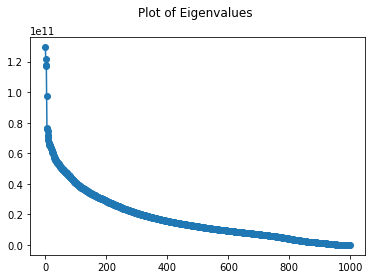

In [15]:
plt.plot(range(len(eigvals)), np.diagonal(eigvals), '-o')
plt.title("Plot of Eigenvalues \n")

Text(0.5, 1.0, 'Differences in Eigenvalue [i] Compared to [i+1] \n')

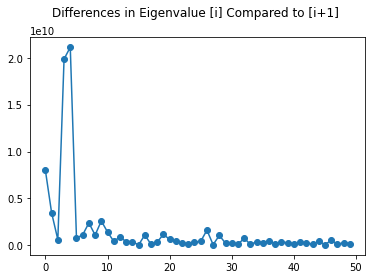

In [16]:
eigvals_diagonal = np.diagonal(eigvals);
differences = []
for i in range(len(eigvals_diagonal) - 1):
    differences.append(eigvals_diagonal[i] - eigvals_diagonal[i + 1])

#  814 or 948
ax = plt.plot(range(50), differences[0:50], '-o')
plt.title("Differences in Eigenvalue [i] Compared to [i+1] \n")

Looking at the scree plot of eigenvalues of the covariance matrix, we can see this curve decreases exponentially. There is a large drop in the magnitude after the third and fourth eigenvalues. It is also important to note that all of these values ate within the magnitude of 10^11 and 10^10. This is showing that the variance is large across many dimensions.

From the second scree plot, we see the differences in each of the first 50 eigenvalues, and there is a very large difference after the 5th eigenvalue. This can also be seen in the first scree plot.

In [17]:
eigvects.shape

(999, 999)

In [18]:
U = Z.T @ eigvects

In [19]:
U = normc(U)
U.shape

(660000, 999)

In [20]:
# mapped and reduced song matrix
C = U.T @ (Z.T)

In [21]:
C.shape

(999, 999)

In [22]:
# reconstruct reduced song (Choose C[i], C5[i], C2[i])
reduced_song = (U @ C[2]).T + mean_song
reduced_song.shape

(660000,)

In [23]:
play(song=(Z[2]), rate=SONGRATE)

In [24]:
play(song=reduced_song, rate=SONGRATE)

We can see that the reconstructed songs sound like an amalgamation of many different songs from the dataset put together. This is probably due to the fact that the most "unique" songs in the dataset were in the direction of the highest variance. Even recconstructing the song from all principal components makes the sound unrecognizeable.

This is similar to the mapping a dog onto a human face Principal Component space. It will not be reconstructed well, because the principal components do not represent its data well.


Our next approach will use a different interpretation of the data. This time we will use the features extracted from the data, given to us in ```features_30_sec.csv```

Plot our reduced data in 2 dimensions

Text(0.5, 1.0, 'Song Data in the First Two Principal Component Directions \n')

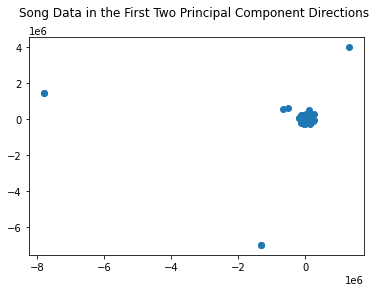

In [25]:
plt.plot(C[0], C[1], 'o')
plt.title("Song Data in the First Two Principal Component Directions \n")

In [26]:
# this code exists to check outliers, 

# # trying to remove outliers
pca_mean = np.median(C, axis=1)# np.mean(C, axis = 1)

# #compute each point's distance from the mean
dists = []
dists_outliers = []
indecies = []
i = 0
for pt in C.T:
    dist = np.linalg.norm(pt - pca_mean) 
    if(1e18 < dist):
        indecies.append(i)
    else:
        dists.append(dist)
    i+=1
    dists_outliers.append(dist)

print("outliers: ")
print(indecies)

outliers: 
[]


Text(0.5, 1.0, "Distribution of Each Point's Distance from the Median \n")

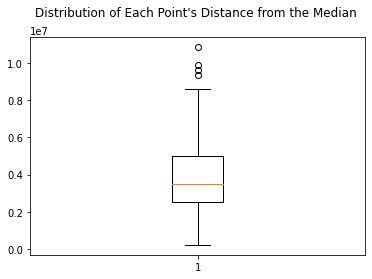

In [27]:
# this code exists to check outliers, but they were removed with hard code in 
# the Preprocessing step earlier

plt.boxplot(dists_outliers)
plt.title("Distribution of Each Point's Distance from the Median \n")

Text(0.5, 1.0, "Distribution of Each Point's Distance from the Median -- No Outliers \n")

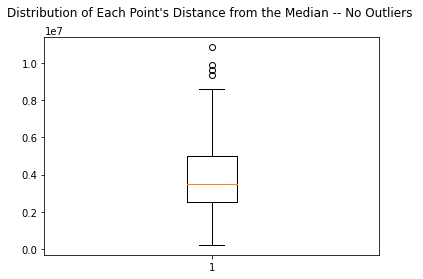

In [28]:
# this code exists to check outliers, but they were removed with hard code in 
# the Preprocessing step earlier

plt.boxplot(dists)
plt.title("Distribution of Each Point's Distance from the Median -- No Outliers \n")

Note: I do not want to re run PCA and use more memory on Colab. Instead I will hard code this outlier index array at the beginning and simply remove these songs from the dataset. This way we can modify the notebook to either analyze songs that contain or do not contain PCA outliers. 

### PCA using the Features of our Data
instead of using the time series

What are MFCC's?

MFCC's are Mel-frequency Cepstral Coefficients and are a lossy conversion. We will not be able to hear the same audio after the mfcc conversion as we do before. This can be heard in the following audio files. 

Warning: viewer discretion is advised

In [30]:
FEATURE_PATH = 'audio_data/features_30_sec.csv'

df = pd.read_csv(FEATURE_PATH, sep=',', header=0)
songs = songs.astype('float64')

In [31]:
mfcc = lb.feature.mfcc(y=songs[0], sr=SONGRATE)
MFCC_SAMPLE_AMT = 1290
mfcc.shape

(20, 1290)

In [32]:
song_from_mfcc = lb.feature.inverse.mfcc_to_audio(mfcc)

Looking at the two different waveforms

(659968,)


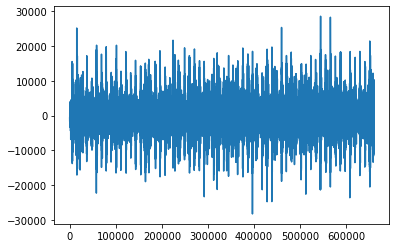

In [33]:
print(song_from_mfcc.shape)
plt.plot(range(len(song_from_mfcc)), song_from_mfcc)

(660000,)


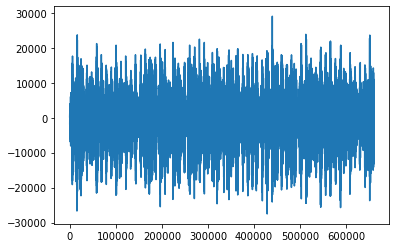

In [34]:
print(songs[0].shape)
plt.plot(range(len(songs[0])), songs[0])

Pre-MFCC

In [35]:
play(song=songs[0], rate=SONGRATE)

Post-MFCC

In [36]:
play(song=song_from_mfcc, rate=SONGRATE)

Looking at the file ```features_30_sec.csv``` we can see that each song has 20 mfcc's. In the file, we see that each of these 20 have a mean and a variance. When actually performing the feature extraction ourselves, using the librosa library, we see that there are 1290 different values for each mfcc. In order to rebuild each audio file, we will sample from the mean and variance of the normal distribution given by each of the 20 mfcc's. This will then be used to "recreate" the audio. 

The assumption made here is that the mfcc values are i.i.d.

In [37]:
def mfcc_to_timeseries(mfcc):

    if(len(mfcc)%2 != 0):
        print('Not given matching means and variances')
  
    counter = 0
    means = []
    vars = []
    for m in mfcc:
        if(counter%2 == 0):
            means.append(m)
        else:
            vars.append(m)
        counter+=1

    arr = []
    for i in range(len(means)):
        arr.append( np.random.normal(loc=means[i], scale=np.sqrt(vars[i]), size=MFCC_SAMPLE_AMT).tolist() )

    timeseries = lb.feature.inverse.mfcc_to_audio(arr)
                                          
    return timeseries

In [38]:
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [39]:
features = df.drop(['filename', 'length', 'label'], axis = 1).values

In [40]:
song_from_distributions = mfcc_to_timeseries(features[0][17:57])

This is the original audio

In [41]:
play(song=songs[0], rate=SONGRATE)

This is the audio after an mfcc conversion

In [42]:
play(song=song_from_mfcc, rate=SONGRATE)

This is the audio after sampling 1290 mfcc's from each of the 20 mfcc distributions and converting them back to a timeseries.

In [43]:
play(song=song_from_distributions, rate=SONGRATE)

Through testing, we see that this is not a good strategy. The parameters of each MFCC values can be sampled and reconstructed into a timeseries piece of audio. However, when we do this, we assume these MFCC values are sampled from a Gaussian and are i.i.d. We do not get a similar soundiung piece of audio with the new samplings.

We can still perform PCA on these features, but we will not be able to get an intuition of how good our aproximation is. This is becasue we do not have a good way to represent the audio other than numbers, as we have no efficient way to convert it back to an audio time series.

PCA on the Features Extracted from Each Song


In [44]:
features = df.drop(['filename', 'length', 'label'], axis=1).values

In [45]:
pca = skl.decomposition.PCA(n_components = 10)
pca.fit(features)

pca.explained_variance_ratio_

array([9.75835655e-01, 2.33424228e-02, 8.18398106e-04, 2.82320299e-06,
       6.26330032e-07, 2.37926679e-08, 2.32703150e-08, 8.01492772e-09,
       5.68979284e-09, 3.96506401e-09])

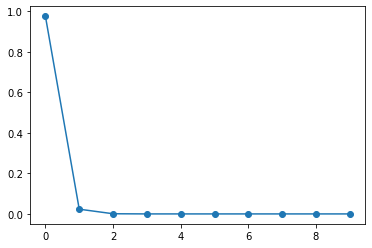

In [46]:
plt.plot(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_, '-o')

We can see that the first principal component explain most of the variance in our features dataset

In [47]:
pca = skl.decomposition.PCA(n_components = 2)

In [48]:
reduced_features = pca.fit_transform(features)

reduced_features.shape

(1000, 2)

Text(0.5, 1.0, 'Our Feature Data in 2 Principal Component Dimensions \n')

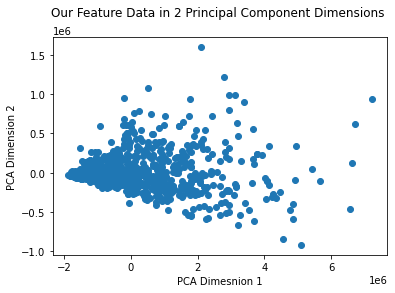

In [49]:
plt.plot(reduced_features.T[0], reduced_features.T[1], 'o')
plt.xlabel("PCA Dimesnion 1")
plt.ylabel("PCA Dimension 2")
plt.title("Our Feature Data in 2 Principal Component Dimensions \n")

In [50]:
reconstructed_features = pca.inverse_transform(reduced_features)

reconstructed_features.shape

(1000, 57)

# K Means for Audio

In [51]:
def calcSqDistances(X, Kmus):
    N, D = X.shape
    K = Kmus.shape[0]
    X_tile = np.tile(X, (K,1,1))
    X_tile = np.transpose(X_tile, axes=[1,0,2])
    differences = X_tile - Kmus
    sqDmat = np.linalg.norm(differences, axis=-1)
    return sqDmat

def determineRnk(sqDmat):
    N, K = sqDmat.shape
    Rnk = np.zeros((N, K))

    for i in range(0,N):
        row = sqDmat[i]
        Rnk[i, np.argmin(row)] = 1
    
    return Rnk

def recalcMus(X, Rnk):
    sum = (1/np.sum(Rnk.T, axis=1))
    return (sum*np.dot(Rnk.T, X).T).T

def runKMeans(K, X):
    N, D = X.shape

    Kmus = np.zeros((K, D))

    rand_inds = np.random.permutation(N)
    Kmus = X[rand_inds[0:K],:]

    maxiters = 1000

    for iter in range(maxiters):

        sqDmat = calcSqDistances(X, Kmus)

        Rnk = determineRnk(sqDmat)

        KmusOld = Kmus

        Kmus = recalcMus(X, Rnk)

        if np.sum(np.abs(KmusOld.reshape((-1, 1)) - Kmus.reshape((-1, 1)))) < 1e-6:
            print("converged on iteration "+ str(iter))
            # print(Kmus)
            break

    return Kmus, Rnk

In [52]:
K_CLUSTERS = 10

In [53]:
Kmus, Rnk = runKMeans(K_CLUSTERS, reduced_features)

converged on iteration 63


In [54]:
spectro_labels = []
for x in range(1000):
    index = np.argwhere(Rnk[x])[0][0]
    spectro_labels.append(index)
spectro_labels = np.asarray(spectro_labels)

In [55]:
df['kmeans_label'] = spectro_labels

In [56]:
df_plot_kmeans = df.groupby(['label', 'kmeans_label']).size().reset_index().pivot(columns='label', index='kmeans_label', values=0)

Text(0.5, 1.0, 'KMeans Song Groupings Colored by Genre')

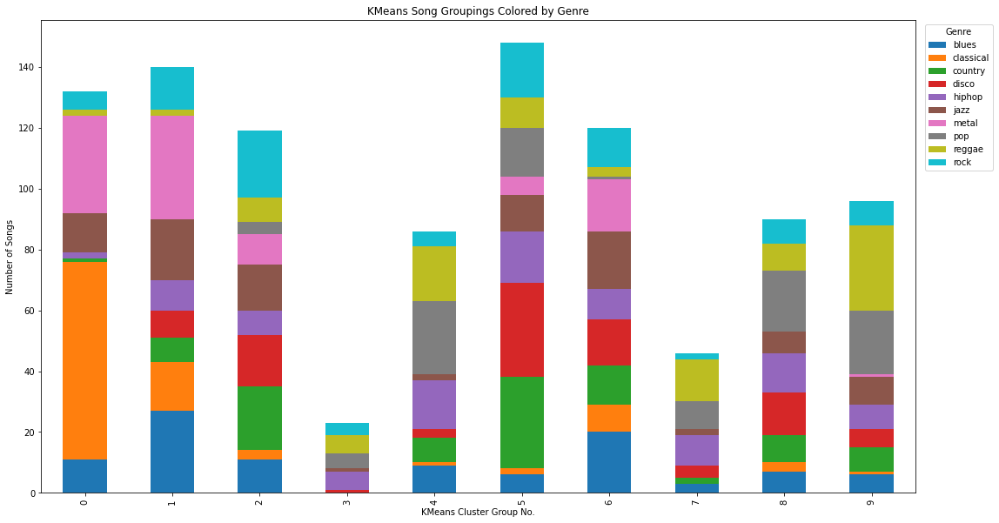

In [57]:
ax = df_plot_kmeans.plot(kind='bar', stacked=True)

plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper center')
ax.figure.set_size_inches(18,10)
plt.ylabel("Number of Songs")
plt.xlabel("KMeans Cluster Group No.")
plt.title("KMeans Song Groupings Colored by Genre")

Using sklearn to compare to our own Kmeans data


In [58]:
kmeans = skl.cluster.KMeans(n_clusters=K_CLUSTERS)
kmeans.fit(features)

KMeans(n_clusters=10)

In [59]:
df["kmeans_label_sklearn_features"] = kmeans.labels_

In [60]:
df_plot_kmeans = df.groupby(['label', 'kmeans_label_sklearn_features']).size().reset_index().pivot(columns='label', index='kmeans_label_sklearn_features', values=0)

Text(0.5, 1.0, 'KMeans Song Groupings Colored by Genre -- SKLearn')

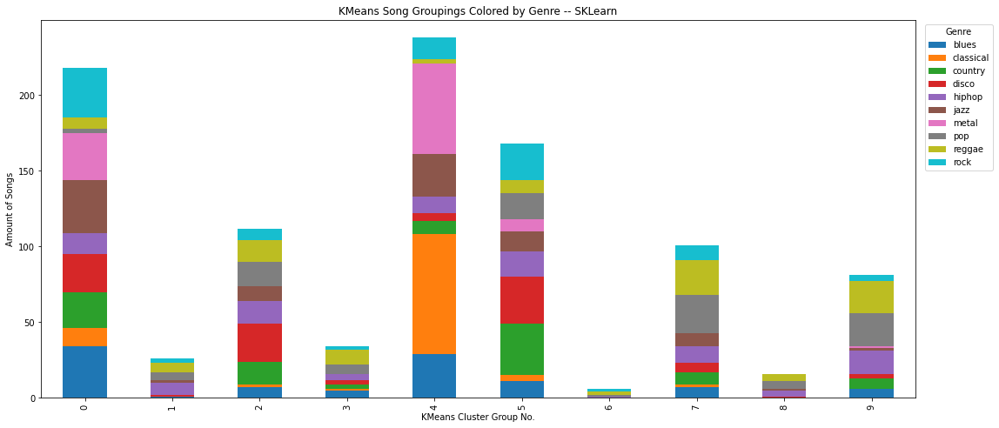

In [61]:
ax = df_plot_kmeans.plot(kind='bar', stacked=True)

plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper center')
ax.figure.set_size_inches(18,8)

plt.ylabel("Amount of Songs")
plt.xlabel("KMeans Cluster Group No.")
plt.title("KMeans Song Groupings Colored by Genre -- SKLearn")

Using sklearn as a prebuilt way to execute kmeans clustering on our timeseries data (using our own uses too much RAM)

# Spectrogram



We want to apply Principal Component Analysis (PCA) on the various spectrogram image files in order to transition to a K Means / Mixture of Gaussian clustering in order to classify each song into a genre. PCA will reduce each image's dimensionality, so that when we move on to our clustering method the reduced images will be easier and quicker to analyze and group into genres.

The first thing to do before anything is to import and store all of the spectrogram png files into an array utilizing OpenCV.

In [62]:
spectogram_data_path = "audio_data/images_original"

In [63]:
images = []

In [64]:
GENRES = ['blues', 'classical', 'country', 'disco', 'hiphop', 
          'jazz', 'metal', 'pop', 'reggae', 'rock']

for i, genre in enumerate(GENRES): # for each genre
    for j in range(100): #for each song 
        # get the song file address
        idx = str(j) if j > 9 else ('0' + str(j));
        file_path = spectogram_data_path + '/'+ genre +'/'+ genre +'000'+ idx + '.png'
        # print(file_path)
        try: #try to load the array into 
            temp = cv.cvtColor(cv.imread(file_path), cv.COLOR_BGR2GRAY)[35:-35, 54:-42]
            images.append(temp)

        except Exception:
            # skip this iteration if error
            # value error means that the audio file is corrupted
            idx = str(j) if j > 9 else ('0' + str(j));
            file_path = './'+ genre +'/'+ genre +'.000'+ idx + '.png'
            # print('audio file '+ file_path +' is corrupted')

In [65]:
images = np.array(images)
images = images.reshape((999, -1))/255
images.shape

(999, 73248)

# PCA for Spectrograms

We can prepare for our PCA implementation by defining an eigsort function, which will sort the found eigenvalues of the images data points minus their mean, and a normc function, which will normalize the vectorized images minus mean and eigenvectors data points.

In [66]:
from sklearn.preprocessing import normalize

def eigsort(V, eigvals):
    
    # Sort the eigenvalues from largest to smallest. Store the sorted
    # eigenvalues in the column vector lambd.
    lohival = np.sort(eigvals)
    lohiindex = np.argsort(eigvals)
    lambd = np.flip(lohival)
    index = np.flip(lohiindex)
    Dsort = np.diag(lambd)
    
    # Sort eigenvectors to correspond to the ordered eigenvalues. Store sorted
    # eigenvectors as columns of the matrix vsort.
    M = np.size(lambd)
    Vsort = np.zeros((M, M))
    for i in range(M):
        Vsort[:,i] = V[:,index[i]]
    return Vsort, Dsort

def normc(Mat):
    return normalize(Mat, norm='l2', axis=0)

We take the mean of each pixel across all 999 spectrograms to be subtracted from each image's pixel value later. A (rather nice looking) plot of these pixel means can be seen below as well.

In [67]:
image_mean = np.mean(images, 0).reshape((1, 73248))
print(image_mean.shape)

(1, 73248)


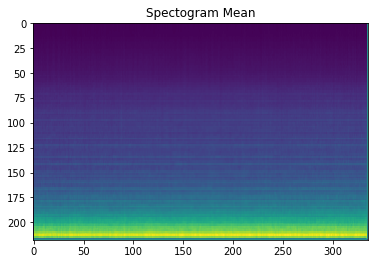

In [68]:
plt.imshow(image_mean.reshape([218,336]))
plt.title("Spectogram Mean")
plt.imsave("image_mean.png", image_mean.reshape([218,336]))

Now we create an images_minus_mean array with images pixel data points minus the pixel overall mean.

In [69]:
images_minus_mean = images - image_mean
print(images_minus_mean.shape)

(999, 73248)


This images_minus_mean array is vectorized with its transpose in order to find its eigenvalues (w) and eigenvectors (v). The eigenvectors are sorted so that they can be vectorized with the transpose of the images_minus_mean to create U, the matrix of images_minus_mean and its trnaspose.

In [70]:
w, v = np.linalg.eig(images_minus_mean @ images_minus_mean.T)
V, W = eigsort(v, w)
print(V.shape)
U = images_minus_mean.T @ V
print(U.shape)

(999, 999)
(73248, 999)


Text(0.5, 1.0, 'Spectogram data reduced to 2 principal components')

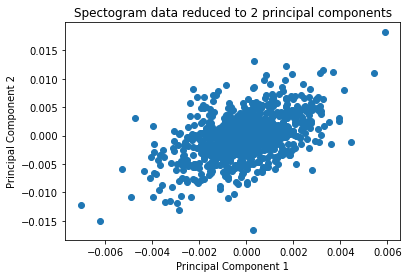

In [71]:
plt.scatter(U[0], U[1])
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Spectogram data reduced to 2 principal components")

The normc function is used on U to normalize all the images to 1, and the first image in U is reshaped and plotted below.

In [72]:
U = normc(U)

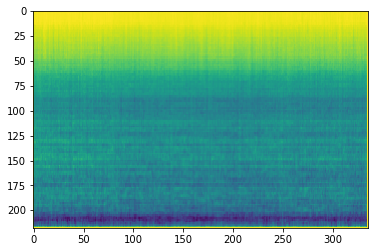

In [73]:
plt.imshow(U[:, 0].reshape([218,336]))

Now we find the principal component coordinates by vectorizing the transposed U with the transposed images_minus_mean matrix, and vectorizing the component space onto U component directions to generate the reconstructed images.

In [74]:
compoenent_space = U.T @ images_minus_mean.T

In [75]:
compoenent_space.shape

(999, 999)

In [76]:
Z = (U @ compoenent_space)
Z = Z.T + image_mean

#Reconstuction of images using all 999 components

Depending on how many images you take from component space and U the reconstructed images can be further reduced.

In [77]:
Z_100 = (U[:, :100] @ compoenent_space[:100, :])
Z_100 = Z_100.T + image_mean

#Reconstruction of images usin first 100 components 

Text(0.5, 1.0, 'Image using all components')

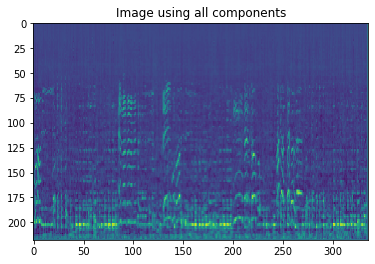

In [78]:
plt.imshow((Z[12]).reshape([218,336]))
plt.title("Image using all components")

Text(0.5, 1.0, 'Image using 100 components')

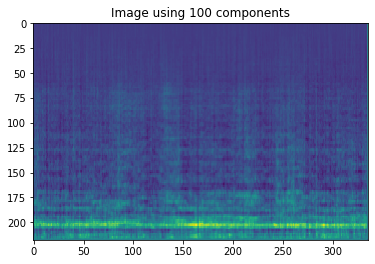

In [79]:
plt.imshow((Z_100[12]).reshape([218,336]))
plt.title("Image using 100 components")

Text(0.5, 1.0, 'Original Image')

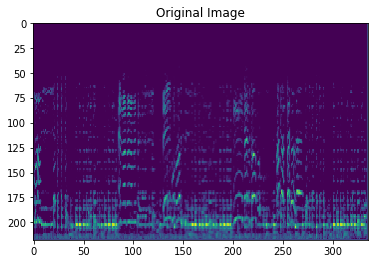

In [80]:
plt.imshow(images[12].reshape([218,336]))
plt.title("Original Image")

Looking at the scree plot comparing the number of PCA components vs the observed variance we can see the exponentially decaying curve as the number of principal components increases.

Text(0, 0.5, 'Variance')

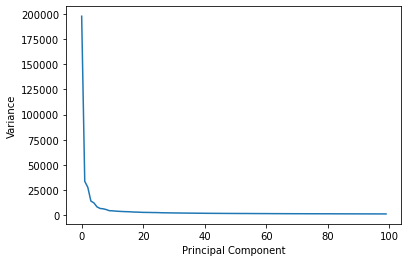

In [81]:
S = np.diagonal(W)
plt.plot(np.arange(100),S[:100])
plt.xlabel("Principal Component")
plt.ylabel("Variance")

# K-Means for Spectrograms

Now that we have the reduced spectrogram images, we can define and carry out our K-Means clustering method. For the function, we first define three functions that each calculate the distances between data points and center cluster points, determine the ranking of each data point (which cluster each point belongs to), and reevaluate where each cluster center is located. These three functions are implemented and iterated in our main function until the difference between the new cluster centers and previous cluster centers fall under a certain value, when both the cluster centers and rankings of each data point can then be defined.

In [82]:
'''
Vectorized calcSqDistances
'''
def calcSqDistances(X, Kmus):
    N, D = X.shape
    K = Kmus.shape[0]
    X_tile = np.tile(X, (K,1,1))
    X_tile = np.transpose(X_tile, axes=[1,0,2])
    differences = X_tile - Kmus
    sqDmat = np.linalg.norm(differences, axis=-1)

    return sqDmat

def determineRnk(sqDmat):
    N, K = sqDmat.shape
    Rnk = np.zeros((N, K))

    for i in range(0,N):
        row = sqDmat[i]
        Rnk[i, np.argmin(row)] = 1
    
    return Rnk

def recalcMus(X, Rnk):
    sum = (1/np.sum(Rnk.T, axis=1))
    return (sum*np.dot(Rnk.T, X).T).T

def runKMeans(K, X):
    #determine and store data set information
    N, D = X.shape

    #allocate space for the K mu vectors
    Kmus = np.zeros((K, D))

    #initialize cluster centers by randomly picking points from the data
    rand_inds = np.random.permutation(N)
    Kmus = X[rand_inds[0:K],:]

    #specify the maximum number of iterations to allow
    maxiters = 1000

    for iter in range(maxiters):
        #assign each data vector to closest mu vector as per Bishop (9.2)
        #do this by first calculating a squared distance matrix where the n,k entry
        #contains the squared distance from the nth data vector to the kth mu vector

        #sqDmat will be an N-by-K matrix with the n,k entry as specfied above
        sqDmat = calcSqDistances(X, Kmus)

        #given the matrix of squared distances, determine the closest cluster
        #center for each data vector

        #R is the "responsibility" matrix
        #R will be an N-by-K matrix of binary values whose n,k entry is set as
        #per Bishop (9.2)
        #Specifically, the n,k entry is 1 if point n is closest to cluster k,
        #and is 0 otherwise
        Rnk = determineRnk(sqDmat)

        KmusOld = Kmus

        #recalculate mu values based on cluster assignments as per Bishop (9.4)
        Kmus = recalcMus(X, Rnk)


        #check to see if the cluster centers have converged.  If so, break.
        if np.sum(np.abs(KmusOld.reshape((-1, 1)) - Kmus.reshape((-1, 1)))) < 1e-6:
            print(iter)
            print(Kmus)
            break

    return Kmus, Rnk

We can now run our K-Means function to find 10 clusters 

In [83]:
Kmus, Rnk = runKMeans(10, Z_100)

21
[[4.36669561e-04 2.17898655e-03 9.73755423e-04 ... 2.00000000e-01
  2.00000000e-01 7.45098039e-02]
 [1.85441240e-04 5.49344229e-04 3.76763039e-04 ... 2.00000000e-01
  2.00000000e-01 7.45098039e-02]
 [5.30090624e-04 9.80242280e-04 7.92956082e-05 ... 2.00000000e-01
  2.00000000e-01 7.45098039e-02]
 ...
 [1.75678241e-04 9.49826052e-04 1.96910397e-04 ... 2.00000000e-01
  2.00000000e-01 7.45098039e-02]
 [2.75617303e-04 7.85866545e-04 7.19490458e-04 ... 2.00000000e-01
  2.00000000e-01 7.45098039e-02]
 [2.46278435e-04 4.48397148e-04 7.79025367e-04 ... 2.00000000e-01
  2.00000000e-01 7.45098039e-02]]


In [84]:
index_list = list(range(10))
number_list = [0,0,0,0,0,0,0,0,0,0]
spectro_labels = []
for x in range(999):
    index = np.argwhere(Rnk[x])[0][0]
    spectro_labels.append(index)
    number_list[index] += 1

In [85]:
number_list

[1, 239, 2, 191, 2, 2, 230, 125, 118, 89]

In [86]:
spectro_df = pd.DataFrame(data={'labels': df['label'].drop(INVALID_SONG_INDEX), 'kmeans_labels': spectro_labels})

In [87]:
df_plot_kmeans_spectro = spectro_df.groupby(['labels', 'kmeans_labels']).size().reset_index().pivot(columns='labels', index='kmeans_labels', values=0)

Text(0.5, 1.0, 'KMeans Song Groupings Colored by Genre')

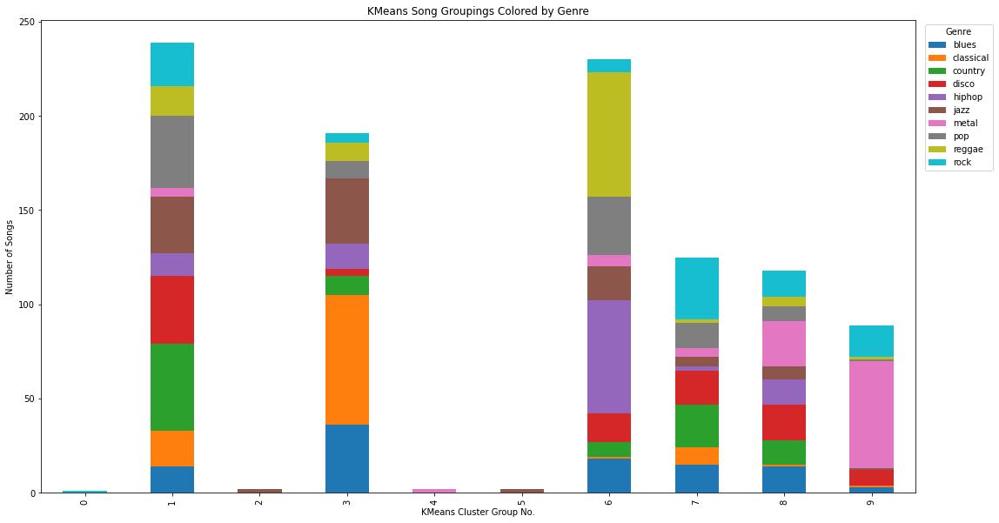

In [88]:
ax = df_plot_kmeans_spectro.plot(kind='bar', stacked=True)

plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper center')
ax.figure.set_size_inches(18,10)
plt.ylabel("Number of Songs")
plt.xlabel("KMeans Cluster Group No.")
plt.title("KMeans Song Groupings Colored by Genre")

### Discussion
In this project, we solidified our understanding of principal component analysis and k-means clustering by applying them to audio data. Through the use of both self created and predefined functions and packages, we came to see the various steps required to carry out these machine learning models and the accuracy levels they can potentially reach with proper refinement. Looking at all of our dimensionality reduction and clustering results, clear improvements can be made in order to increase the accuracy of our intended genre grouping. In the future we would look into refining our PCA methods to raise the reduced data’s overall representation of the original data. We would also expand our unsupervised machine learning model arsenal to potentially utilize more accurate and better suited models on this audio data, straying away from k-means clustering. Although k-means clustering has the capability to work, there are no doubt more optimized methods of approach for this type of clustering with audio, which we would utilize to improve accuracy. In terms of expanding our project, we would look into creating a model that could generate certain genres of music based on prior knowledge and desired parameters for the generated song. Once classification is optimized and genre clustering can be demonstrated and proved, the natural next step would be to transition that into a music generator which could create interesting and (hopefully) entertaining songs.
